# CellRank pipeline, time series datasets (Waddington Optimal Transport)

## Import packages and set up the analysis

In [1]:
import sys

# the installation can take ~10mins
# ignore the messages: ERROR: Failed building wheel for <package>
# as long as it later print: Running setup.py install for <package> ... done
if "google.colab" in sys.modules:
    %pip install -q git+https://github.com/theislab/cellrank@dev#egg=cellrank[external,krylov]

In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.io as pio
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# import CellRank kernels and estimators
from cellrank.external.kernels import WOTKernel
from cellrank.tl.kernels import ConnectivityKernel
from cellrank.tl.estimators import GPCCA

In [3]:
# set verbosity levels
cr.settings.verbosity = 1
scv.settings.verbosity = 1

In [4]:
ROOT_FOLDER_H5AD = "/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/inputData/h5adObjects"
ROOT_FOLDER_TABLES = "/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/inputData/tables"

BASEANALYSIS = "/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/ciml5"
if not os.path.exists(BASEANALYSIS):
    os.mkdir(BASEANALYSIS)
    
h5adObjects = os.path.join(BASEANALYSIS,'h5ad.objects')
if not os.path.exists(h5adObjects):
    os.mkdir(h5adObjects)
    
PATH_FIGURES = os.path.join(BASEANALYSIS, "figures")
if not os.path.exists(PATH_FIGURES):
    os.mkdir(PATH_FIGURES)

PATH_CACHE = os.path.join(BASEANALYSIS, "cache")
if not os.path.exists(PATH_CACHE):
    os.mkdir(PATH_CACHE)

sc.settings.figdir = PATH_FIGURES
sc.settings.cachedir = PATH_CACHE
scv.settings.figdir = PATH_FIGURES
cr.settings.figdir = PATH_FIGURES

In [5]:
# color table
colors_transferred_df = pd.read_csv(os.path.join(ROOT_FOLDER_TABLES,'clusterColors.tsv'),sep='\t')
colors_transferred_dic = colors_transferred_df.set_index('transferred_identity').to_dict()['blind_friendly']
colors_days_dic = {'Day_04': "#bb573b", 'Day_05': "#ac9d3e", 'Day_06': "#5aaf6a", 'Day_11': "#b94c84"}

In [6]:
analysis = "lab_4_days"
ANALYSIS_FOLDER = os.path.join(BASEANALYSIS, analysis)
if not os.path.exists(ANALYSIS_FOLDER):
    os.mkdir(ANALYSIS_FOLDER)
label_days = "days 4-5-6-11"

## Load the data

In [7]:
adata = sc.read_h5ad(os.path.join(ROOT_FOLDER_H5AD, '00_rawData_filtered_lab_4_days.h5ad'))


In [8]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [9]:
# umap coordinates
DR2d = pd.read_csv("/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/seuratAnalysis/ciml5/lab_4_days_merged/final_umap2Dcoordinates_lab_4_days_merged.csv", sep=",", index_col=0)
UMAP2d = DR2d.loc[adata.obs.index,[x for x in DR2d.columns.tolist() if "UMAP2d" in x]]
DR3d = pd.read_csv("/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/seuratAnalysis/ciml5/lab_4_days_merged/final_umap3Dcoordinates_lab_4_days_merged.csv", sep=",", index_col=0)
UMAP3d = DR3d.loc[adata.obs.index,[x for x in DR3d.columns.tolist() if "UMAP3d" in x]]
adata.obsm['X_umap2d'] = UMAP2d.to_numpy(dtype="float32")
adata.obsm['X_umap3d'] = UMAP3d.to_numpy(dtype="float32")

In [10]:
adata.obs.rename_axis('cellNames')

,orig.ident,nCount_RNA,nFeature_RNA
cellNames,,,
lab_day_04_1_AAACCCAAGTACAGAT,lab_4_days,59952.0,6798
lab_day_04_1_AAACCCAAGTTCATCG,lab_4_days,38805.0,5932
lab_day_04_1_AAACCCACAAGCGAAC,lab_4_days,45520.0,6008
lab_day_04_1_AAACCCACAAGGTTGG,lab_4_days,26325.0,4495
lab_day_04_1_AAACCCACACATATGC,lab_4_days,28761.0,4952
...,...,...,...
lab_day_11_1_TTTGTTGAGGTAGATT,lab_4_days,21741.0,4056
lab_day_11_1_TTTGTTGAGGTGAGCT,lab_4_days,8956.0,2818
lab_day_11_1_TTTGTTGCAATATCCG,lab_4_days,9959.0,2919


In [11]:
adata.obs = adata.obs.rename_axis('cellNames')
adata.obs['day'] = ['_'.join(x.split('_')[1:3]).capitalize() for x in adata.obs.index]

In [12]:
adata.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,day
cellNames,,,,
lab_day_04_1_AAACCCAAGTACAGAT,lab_4_days,59952.0,6798,Day_04
lab_day_04_1_AAACCCAAGTTCATCG,lab_4_days,38805.0,5932,Day_04
lab_day_04_1_AAACCCACAAGCGAAC,lab_4_days,45520.0,6008,Day_04
lab_day_04_1_AAACCCACAAGGTTGG,lab_4_days,26325.0,4495,Day_04
lab_day_04_1_AAACCCACACATATGC,lab_4_days,28761.0,4952,Day_04


saving figure to file /mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/ciml5/figures/scvelo_cellRank_lab_4_days_UMAP_coloredByDay.pdf


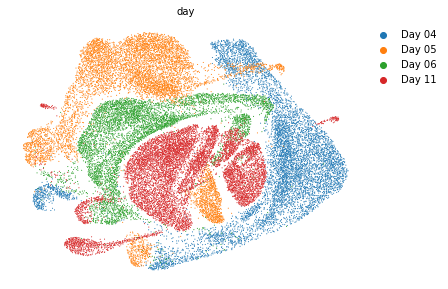

In [13]:
scv.pl.scatter(adata, basis="umap2d", c='day', save="cellRank_lab_4_days_UMAP_coloredByDay.pdf")

## Preprocess the data

In [14]:
sc.pp.highly_variable_genes(adata)
sc.pp.pca(adata, use_highly_variable=True)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30, random_state=17)
adata

AnnData object with n_obs × n_vars = 26658 × 22323
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'day'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'day_colors', 'hvg', 'pca', 'neighbors'
    obsm: 'X_umap2d', 'X_umap3d', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

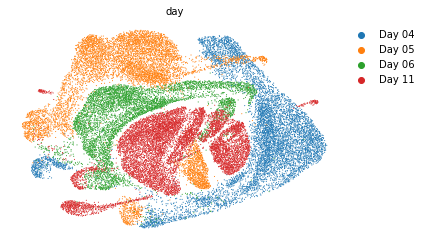

In [15]:
scv.pl.scatter(adata, basis="umap2d", c="day")

## Estimate initial growth rates

In [16]:
adata.obs['stage'] = adata.obs['day'].str[-2:].astype(int)
adata.obs.stage.head()

cellNames
lab_day_04_1_AAACCCAAGTACAGAT    4
lab_day_04_1_AAACCCAAGTTCATCG    4
lab_day_04_1_AAACCCACAAGCGAAC    4
lab_day_04_1_AAACCCACAAGGTTGG    4
lab_day_04_1_AAACCCACACATATGC    4
Name: stage, dtype: int64

In [17]:
wk = WOTKernel(adata, time_key="stage")

In [18]:
#wk.compute_initial_growth_rates(organism="mouse", key_added="growth_rate_init")

In [19]:
#prolif_genes = ['Mcm4', 'Smc4', 'Gtse1', 'Ttk', 'Rangap1', 'Ccnb2', 'Cenpa', 'Cenpe', 'Cdca8', 'Ckap2', 'Rad51', 'Pcna', 'Ube2c', 'Lbr', 'Cenpf', 'Birc5', 'Dtl', 'Dscc1', 'Cbx5', 'Usp1', 'Hmmr', 'Wdr76', 'Ung', 'Hn1', 'Cks2', 'Kif20b', 'Cdk1', 'Slbp', 'Aurkb', 'Kif11', 'Cks1b', 'Blm', 'Msh2', 'Gas2l3', 'Tyms', 'Hjurp', 'Hells', 'Prim1', 'Uhrf1', 'Ndc80', 'Mcm6', 'Rrm1', 'Mlf1ip', 'Top2a', 'Hmgb2', 'Ccne2', 'G2e3', 'Tmpo', 'Nusap1', 'Ncapd2', 'Mcm2', 'Kif2c', 'Cdca2', 'Nasp', 'Gmnn', 'Cdc6', 'Pold3', 'Ckap2l', 'Fam64a', 'Ubr7', 'Fen1', 'Bub1', 'Brip1', 'Atad2', 'Psrc1', 'Rrm2', 'Tipin', 'Casp8ap2', 'Tubb4b', 'Kif23', 'Exo1', 'Rfc2', 'Pola1', 'Mki67', 'Tpx2', 'Aurka', 'Anln', 'Chaf1b', 'Hjurp', 'Tacc3', 'Mcm5', 'Anp32e', 'Dlgap5', 'Ect2', 'Nuf2', 'Cdc45', 'Ckap5', 'Ctcf', 'Clspn', 'Cdca7', 'Cdca3', 'Rpa2', 'Gins2', 'E2f8', 'Cdc25c', 'Nek2', 'Cdc20', 'Rad51ap1']
#availGenes = [gene for gene in prolif_genes if gene in adata.var_names ]
#print(str(len(availGenes)) + " proliferation genes over the " + str(len(prolif_genes)) + " provided.")
#availGenes

I'm not able to use the proliferation genes provided by the kernel WOT. I still continue the analysis as it is mentioned in the tutorial of the tool:

> Notes
> 
> If you don’t have access to proliferation/apoptosis gene sets, you can use the ones defined in cellrank for a specific organism. Alternatively, you can also use WOT without an estimate of initial growth rates. In that case, make sure to use several iterations in cellrank.external.kernels.WOTKernel.compute_transition_matrix() by increasing the growth_iters parameter. A value around 3 works well in most cases.

In [20]:
#scv.pl.scatter(
#    adata, c="growth_rate_init", legend_loc="right", basis="umap_2d", s=10
#)

## Compute transition matrix

In [21]:
wk.compute_transition_matrix(
    growth_iters=3, last_time_point="connectivities"
)

  0%|          | 0/3 [00:00<?, ?time pair/s]

<WOTKernel>

## Simulate random walks

Following code chunk starts the random walks from the stage 4 (ie. day4).

  0%|          | 0/100 [00:00<?, ?sim/s]

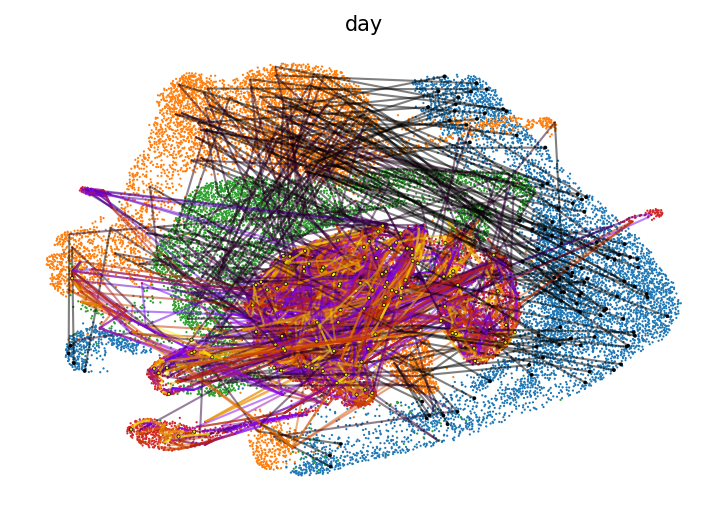

In [22]:
wk.plot_random_walks(
    n_sims=100,
    max_iter=50,
    start_ixs={"stage": [4]},
    basis="umap2d",
    c="day",
    legend_loc="none",
    linealpha=0.5,
    dpi=150,
    seed=17,
    n_jobs=8,
    save="cellRank_lab_4_days_RW_start.day04.pdf"
)

### Addition of celltype and cluster information of each cells

In [23]:
# multi time-point information
multiTPmetadata = pd.read_csv("/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/seuratAnalysis/ciml5/lab_4_days_merged/metadata_celltypeANDclusters_lab_4_days_merged.csv", sep=',')
adata.obs = adata.obs.join(multiTPmetadata)

# single time-point information
for dataset in ["lab_day_04", "lab_day_05", "lab_day_06", "lab_day_11"]:
    if "singleTPmetadata" not in globals():
        singleTPmetadata = pd.read_csv("/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/seuratAnalysis/ciml5/" + dataset + "/metadata_celltypeANDclusters_" + dataset + ".csv", sep=",")
    else:
        additionalMD = pd.read_csv("/mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/seuratAnalysis/ciml5/" + dataset + "/metadata_celltypeANDclusters_" + dataset + ".csv", sep=",")
        singleTPmetadata = pd.concat([singleTPmetadata, additionalMD])

singleTPmetadata.drop(['celltype_DF'], axis=1, inplace=True)
singleTPmetadata.head()

adata.obs = adata.obs.join(singleTPmetadata)
adata.obs['multiTP_res1'] = adata.obs['multiTP_res1'].astype('category')
adata.obs['multiTP_celltype'] = adata.obs['multiTP_celltype'].astype('category')
adata.obs['singleTP_res1'] = adata.obs['singleTP_res1'].astype('category')
adata.obs['singleTP_celltype'] = adata.obs['singleTP_celltype'].astype('category')
adata.obs.head()

adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 26658 × 22323
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'day', 'stage', 'estimated_growth_rates', 'multiTP_celltype', 'multiTP_res1', 'singleTP_celltype', 'singleTP_res1'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'day_colors', 'hvg', 'pca', 'neighbors', 'stage_colors'
    obsm: 'X_umap2d', 'X_umap3d', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'>

In [24]:
# create dataframe to plot
df1 = pd.DataFrame(adata.obsm['X_umap2d'], index=adata.obs.index, columns=['UMAP_1', 'UMAP_2'])
#df1 = pd.DataFrame(adata.obsm['X_umap3d'], index=adata.obs.index, columns=['UMAP_1', 'UMAP_2', 'UMAP_3'])
df2 = pd.DataFrame(adata.obs)
#df3 = pd.DataFrame(adata.obs['ct_scmapAtlas'], index=adata.obs.index, columns=['ct_scmapAtlas'])
df = pd.concat([df1,df2], axis=1).sort_values(by = 'day')
#fig = px.scatter_3d(df, x="UMAP_1", y="UMAP_2", z="UMAP_3",
#    color="day",
#    hover_name='singleTP.celltype', color_discrete_sequence=['dodgerblue','orange','green','red'],
#    height=1500, title="Complete dataset over " + label_days + " -- coloration by day")
#fig
fig = px.scatter(df, x="UMAP_1", y="UMAP_2", color="day",
    hover_name='singleTP_celltype',
    color_discrete_sequence=['dodgerblue','orange','green','red'],
    height=1500,
    title="Complete dataset over " + label_days + " -- coloration by day",
    hover_data={
        'UMAP_1':False,
        'UMAP_2':False,
        'day':True,
        'singleTP_res1':True,
        'multiTP_res1':True
    }
)
fig

  0%|          | 0/50 [00:00<?, ?sim/s]

  0%|          | 0/1 [00:00<?, ?sim/s]

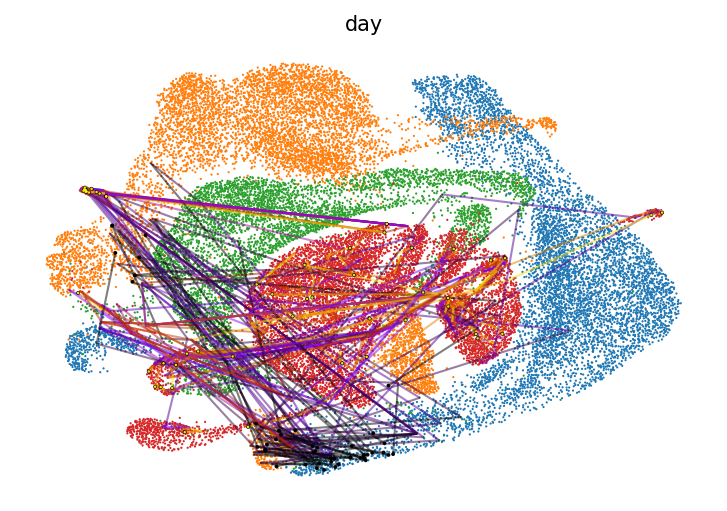

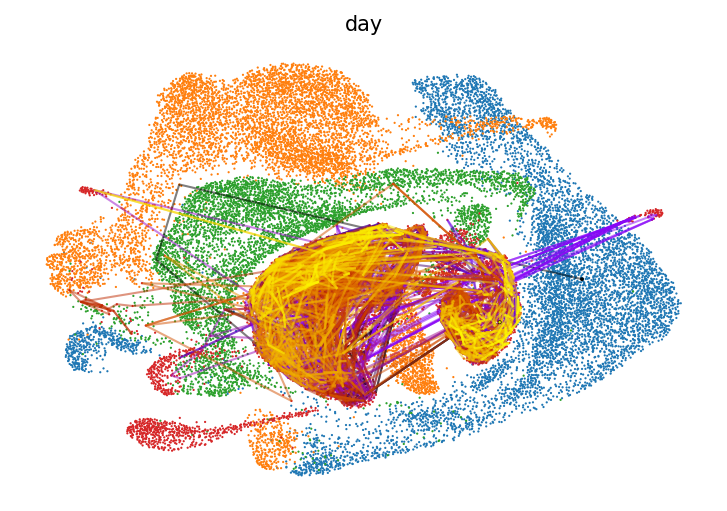

In [25]:
wk.plot_random_walks(
    n_sims=50,                                      # Number of simulations
    max_iter=20,
    start_ixs={"singleTP_celltype": ["Epiblast"]},  # start from epiblast cells indentified during singleTP analysis
    basis="umap2d",
    c="day",
    legend_loc="none",
    linealpha=0.5,
    dpi=150,
    save="cellRank_lab_4_days_RW_start.epiblast_singleTP_NSIM.50.pdf"
)

wk.plot_random_walks(
    n_sims=1,
    start_ixs={"day": ["Day_04"]},
    basis="umap2d",
    c="day",
    legend_loc="none",
    linealpha=0.5,
    dpi=150,
    save="cellRank_lab_4_days_RW_start.day04_2_NSIM.1.pdf"
)

  0%|          | 0/1 [00:00<?, ?sim/s]

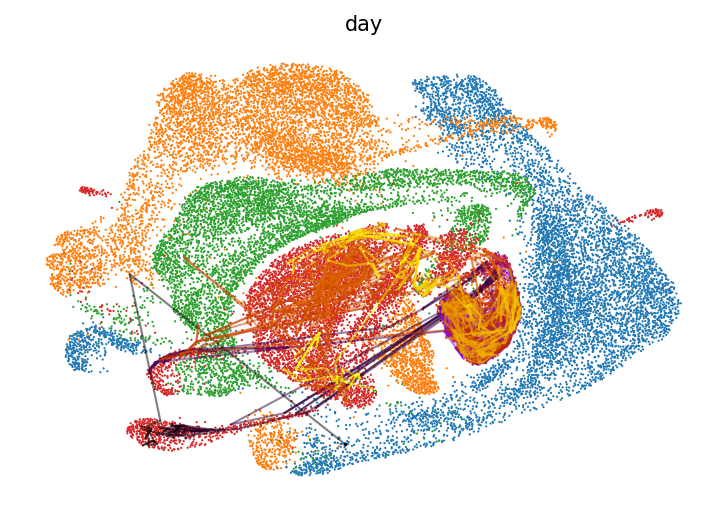

In [26]:
wk.plot_random_walks(
    n_sims=1,
    max_iter=0.1,
    start_ixs={"multiTP_celltype": ["Epiblast"]},
    stop_ixs={"multiTP_res1": ["27"]},
    successive_hits=2,
    basis="umap2d",
    c="day",
    legend_loc="none",
    linealpha=0.5,
    dpi=150,
    save="cellRank_lab_4_days_RW_start.epiblast_mutliTP_NSIM.1.pdf"
)

In [27]:
adata

AnnData object with n_obs × n_vars = 26658 × 22323
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'day', 'stage', 'estimated_growth_rates', 'multiTP_celltype', 'multiTP_res1', 'singleTP_celltype', 'singleTP_res1'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'day_colors', 'hvg', 'pca', 'neighbors', 'stage_colors'
    obsm: 'X_umap2d', 'X_umap3d', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In the following code chunk the random walks should start from the epiblast of day 4 (cluster 'single.res1' equals to 4.9).

In [28]:
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 26658 × 22323
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'day', 'stage', 'estimated_growth_rates', 'multiTP_celltype', 'multiTP_res1', 'singleTP_celltype', 'singleTP_res1'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'day_colors', 'hvg', 'pca', 'neighbors', 'stage_colors'
    obsm: 'X_umap2d', 'X_umap3d', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'>

In [29]:
epiblast = adata.obs.singleTP_res1[adata.obs.multiTP_celltype == "Epiblast"].value_counts(ascending=False)
epiblast

4_9     133
5_14     25
5_11     22
6_16      5
5_6       4
       ... 
4_2       0
4_3       0
4_4       0
4_5       0
6_9       0
Name: singleTP_res1, Length: 65, dtype: int64

In [30]:
epiblast.loc[set(epiblast.index).intersection(set(adata.obs.day == "Day_04"))]


Series([], Name: singleTP_res1, dtype: int64)

  0%|          | 0/100 [00:00<?, ?sim/s]

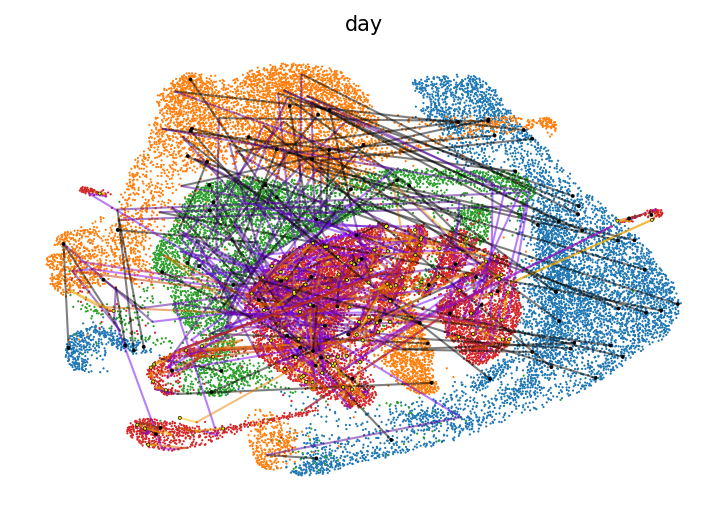

In [31]:
wk.plot_random_walks(
    n_sims=100,
    max_iter=10,
    start_ixs={'singleTP_res1': ['4.9']},
    basis="umap2d",
    c="day",
    legend_loc="none",
    linealpha=0.5,
    dpi=150,
    save="cellRank_lab_4_days_RW_start.cluster.4.9_singleTP_NSIM.100.pdf"
)

<!-- ## Probability mass flow in time

The cluster in title is the cluster for wich to visualize outgoing flow. The `min_flow` parameter is a bottom threshold to show flow edges with flow greater than this value. -->

## Compute macrostates

In [32]:
ck = ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.8 * wk + 0.2 * ck

In [33]:
g = GPCCA(combined_kernel)

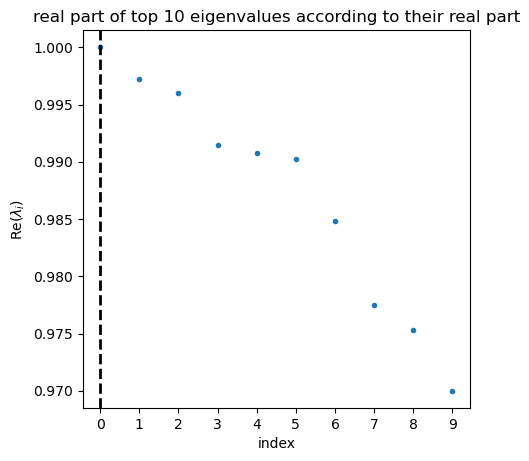

In [34]:
g.compute_schur()
g.plot_spectrum(real_only=True, save="cellRank_lab_4_days_gpcca_SchurDecomposition.pdf")

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



saving figure to file /mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/ciml5/figures/scvelo_cellRank_lab_4_days_gpcca_macrostates_N.9.pdf


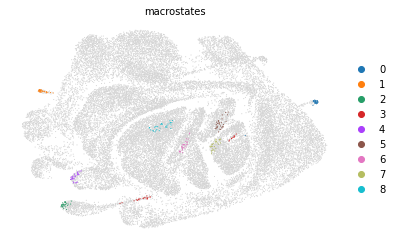

In [35]:
g.compute_macrostates(n_states=9)
g.plot_macrostates(discrete=True,
                   basis="umap2d",
                   legend_loc="right",
                   save="cellRank_lab_4_days_gpcca_macrostates_N.9.pdf"
                  )

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



saving figure to file /mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/ciml5/figures/scvelo_cellRank_lab_4_days_gpcca_macrostates_N.6.pdf


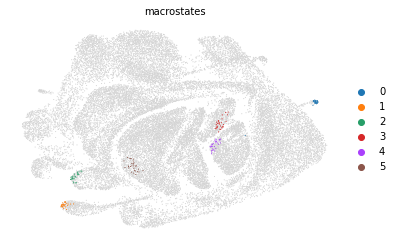

In [36]:
g.compute_macrostates(n_states=6)
g.plot_macrostates(discrete=True,
                   basis="umap2d",
                   legend_loc="right",
                   save="cellRank_lab_4_days_gpcca_macrostates_N.6.pdf"
                  )

## Define terminal macrostates

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



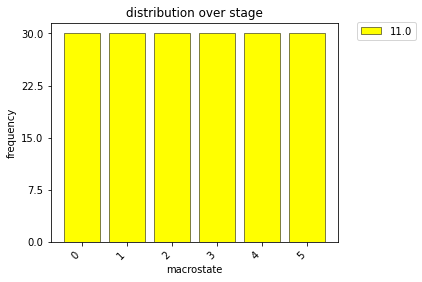

In [37]:
g.plot_macrostate_composition(key="stage", save="cellRank_lab_4_days_gpcca_macrostates_validation.pdf")

In [38]:
terminal_clusters = g.macrostates.cat.categories
g.set_terminal_states_from_macrostates(terminal_clusters)

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [39]:
macroS_list = adata.obs.terminal_states.cat.categories.to_list()
for aMacro in macroS_list:
    macro = adata.obs[adata.obs.terminal_states == aMacro]
    macro.to_csv(os.path.join(ANALYSIS_FOLDER, "cellRank_lab_4_days_macrostate" + str(aMacro) + "_probabilities.csv"))

adata.obs[adata.obs.terminal_states == "0"].head()

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,orig.ident,nCount_RNA,nFeature_RNA,day,stage,estimated_growth_rates,multiTP_celltype,multiTP_res1,singleTP_celltype,singleTP_res1,terminal_states,terminal_states_probs
cellNames,,,,,,,,,,,,
lab_day_11_1_AAGAACACAACTACGT,lab_4_days,36826.0,4939,Day_11,11.0,NaN,Cardiomyocytes,27,Cardiomyocytes,11_18,0,0.988091
lab_day_11_1_AATCGACAGGCTCACC,lab_4_days,6011.0,2349,Day_11,11.0,NaN,Cardiomyocytes,27,Cardiomyocytes,11_18,0,0.992201
lab_day_11_1_AATTCCTCAATGAAAC,lab_4_days,17340.0,3693,Day_11,11.0,NaN,Cardiomyocytes,27,Cardiomyocytes,11_18,0,0.994492
lab_day_11_1_AGAGCAGAGATAGCAT,lab_4_days,25652.0,3875,Day_11,11.0,NaN,Cardiomyocytes,27,Cardiomyocytes,11_18,0,0.984143
lab_day_11_1_AGCTCAACAAACGAGC,lab_4_days,51099.0,5474,Day_11,11.0,NaN,Cardiomyocytes,27,Cardiomyocytes,11_18,0,0.981206


## Compute fate probabilities

In [40]:
g.compute_absorption_probabilities(solver="gmres", use_petsc=True)
absorptionProba = g.absorption_probabilities

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



  0%|          | 0/6 [00:00<?, ?/s]

In [41]:
absorptionProba = pd.DataFrame(absorptionProba)
absorptionProba["cellID"] = adata.obs.index
absorptionProba.set_index("cellID", inplace=True)
absorptionProba.head()

,0,1,2,3,4,5
cellID,,,,,,
lab_day_04_1_AAACCCAAGTACAGAT,0.037110,0.113209,0.177643,0.118421,0.171618,0.381999
lab_day_04_1_AAACCCAAGTTCATCG,0.037056,0.090000,0.136235,0.123176,0.151362,0.462172
lab_day_04_1_AAACCCACAAGCGAAC,0.038775,0.086280,0.099056,0.119580,0.159546,0.496763
lab_day_04_1_AAACCCACAAGGTTGG,0.038638,0.117643,0.139596,0.162299,0.164876,0.376949
lab_day_04_1_AAACCCACACATATGC,0.037575,0.130456,0.192753,0.146057,0.141722,0.351437


In [42]:
absorptionProba.to_csv(os.path.join(ANALYSIS_FOLDER, "cellRank_lab_4_days_allCells_to_allMacroS_absorptionProbabilities.csv"))

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning:

The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.



saving figure to file /mnt/DATA_4TB/projects/gastruloids_sc_Lescroart/analysis/lineageInference/ciml5/figures/scvelo_cellRank_lab_4_days_gpcca_fateProbabilities_NmacroStates.6.pdf


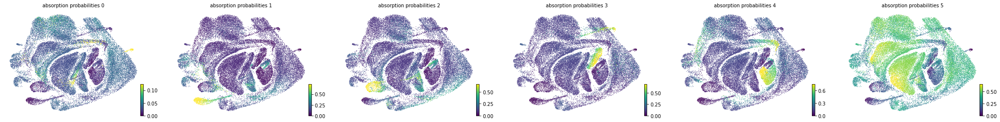

In [43]:
g.plot_absorption_probabilities(same_plot=False, basis="umap2d", perc=[0, 99], save="cellRank_lab_4_days_gpcca_fateProbabilities_NmacroStates.6.pdf")

<!-- ## Log-odds in time -->

## Driver genes

In [44]:
drivers = g.compute_lineage_drivers(return_drivers=False)
drivers.to_csv(os.path.join(ANALYSIS_FOLDER, "cellrank_lab_4_days_lineageDrivers_NmacroS." + str(len(macroS_list)) + ".csv"))

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [45]:
n_feat = 15

clust = "0"
top_0 = adata.varm['terminal_lineage_drivers'].filter(regex=(clust+"_corr")).sort_values(by=clust+"_corr", ascending=False).iloc[:n_feat].index[:].tolist()

clust = "4"
top_4 = adata.varm['terminal_lineage_drivers'].filter(regex=(clust+"_corr")).sort_values(by=clust+"_corr", ascending=False).iloc[:n_feat].index[:].tolist()

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [46]:
goi = {
    "0": top_0,
    "4": top_4
}

# compute mean gene expression across cells, so we have somethign nice to color the dots by
#adata.var["means"] = adata.X.A.mean(axis=0)

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [47]:
goi

{'0': ['Myh3',
  'Mymk',
  'Mylk4',
  'Tnnc2',
  'Myog',
  'Mybph',
  'Neb',
  'Il17b',
  'Sgcg',
  'Klhl41',
  'Myod1',
  'Chrna1',
  'Ablim3',
  'Cdh15',
  'Gm28653'],
 '4': ['Cryab',
  'Hspb7',
  'Tnnc1',
  'Mybpc3',
  'Myh6',
  'Pgam2',
  'Csrp3',
  'Sh3bgr',
  'Hspb2',
  'Ryr2',
  'Myl7',
  'Cox6a2',
  'Myl4',
  'Tnni3',
  'Tnnt2']}

... storing 'orig.ident' as categorical
/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:724: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

... storing 'orig.ident' as categorical
/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:724: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

... storing 'orig.ident' as categorical
/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:724: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

... storing 'orig.ident' as categorical
/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:724: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

... storing 'orig.ident' as categorical
/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scanpy/plotting/_u

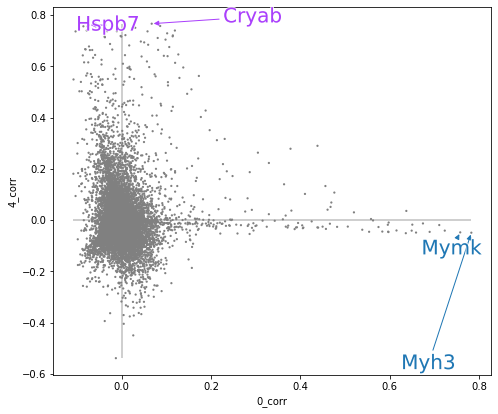

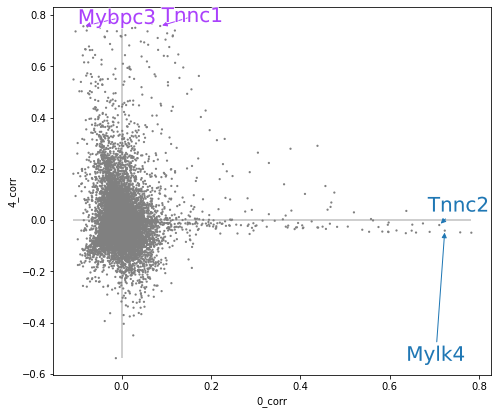

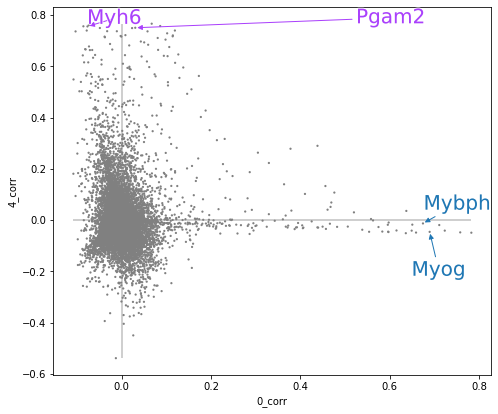

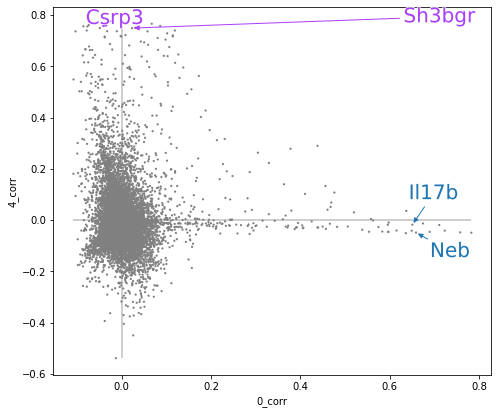

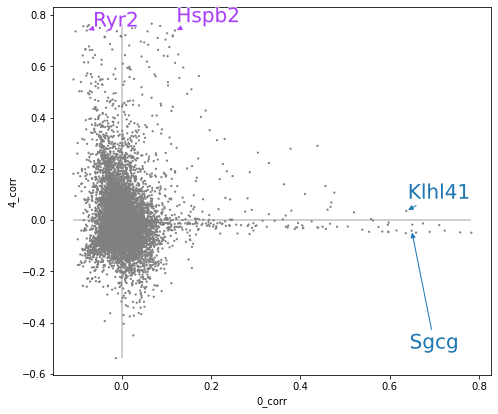

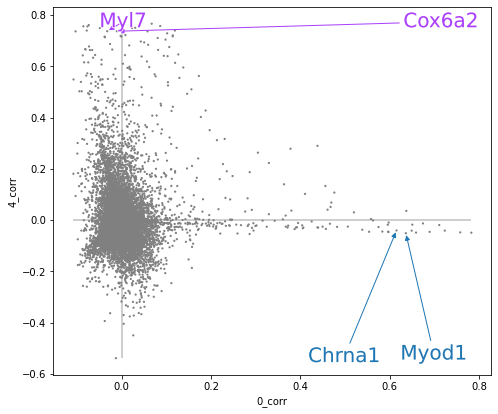

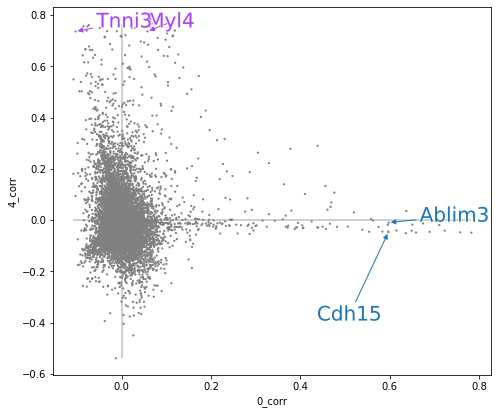

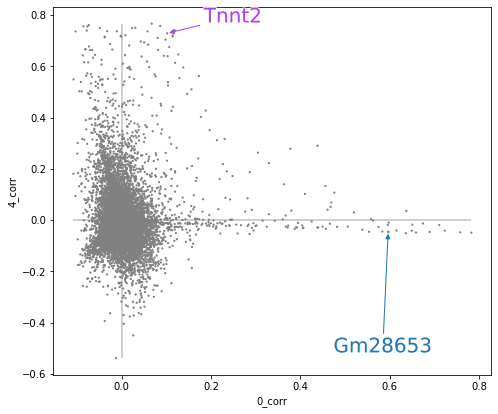

In [48]:
for i in range(0,15,2):
    g.plot_lineage_drivers_correlation(
        lineage_x="0",
        lineage_y="4",
        gene_sets={"0": goi['0'][i:i+2],
                   "4": goi['4'][i:i+2]},
        legend_loc="none",
        figsize=(7, 7),
        fontsize=20,
        title=["driver genes for 0 vs. 4 differentiation"],
        size=20,
        adjust_text=True,
        save="cellRank_lab_4_days_gpcca_lineageDriversCorrelation_0-vs-4." + '.'.join(goi['0'][i:i+2]) + "-vs-" + '.'.join(goi['4'][i:i+2]) + ".pdf"
    )

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/opt/anaconda3/envs/veloRossi/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning:

The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.



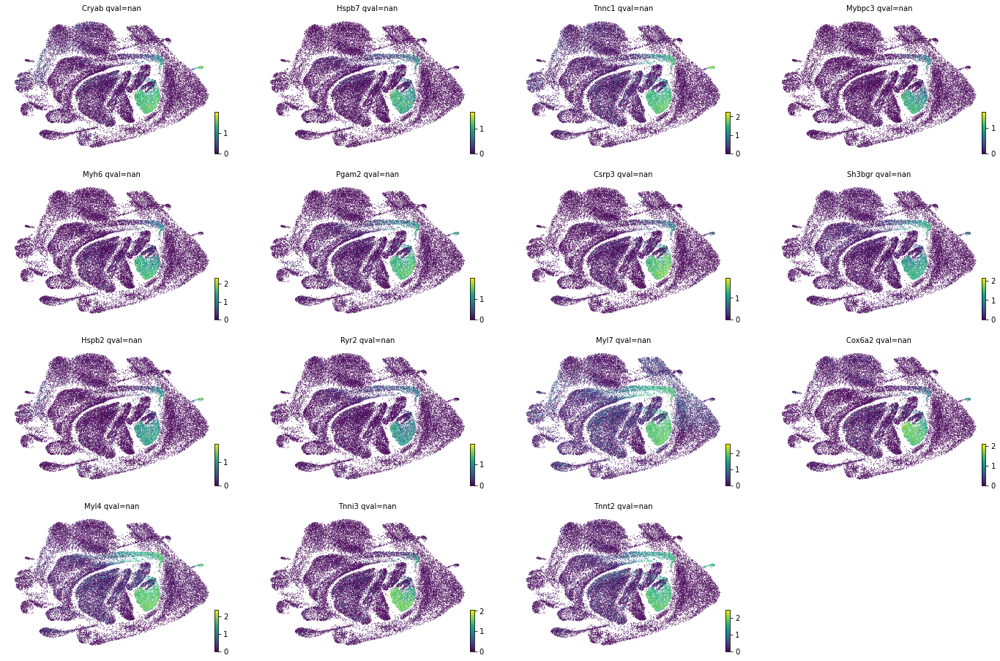

In [49]:
g.plot_lineage_drivers('4', basis="umap2d", n_genes=15)

... storing 'orig.ident' as categorical


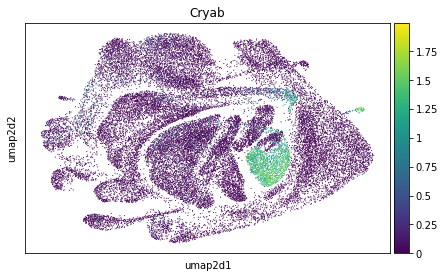

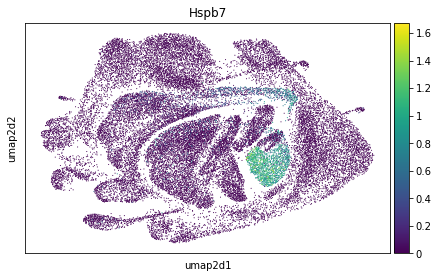

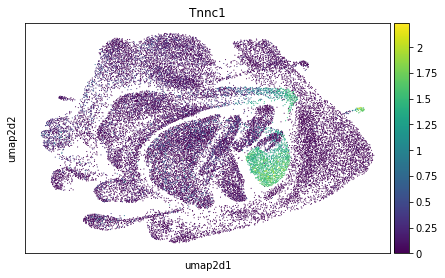

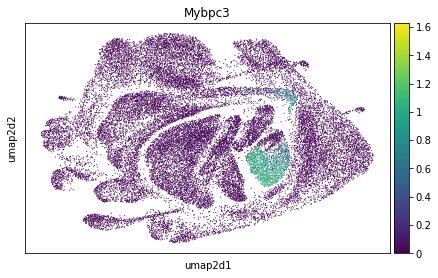

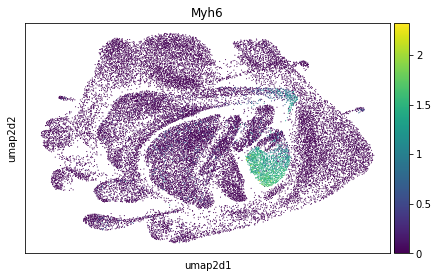

...

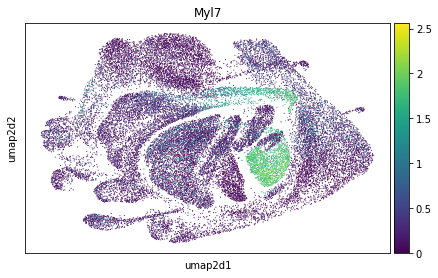

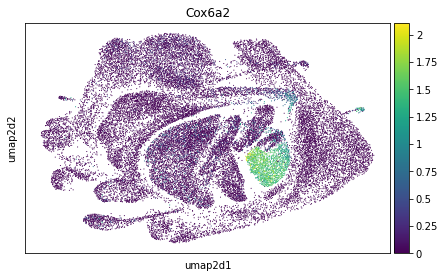

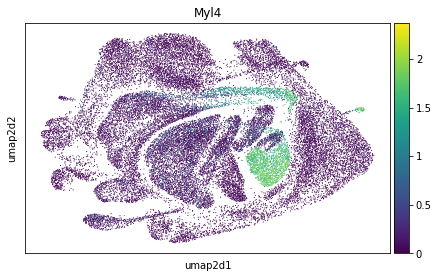

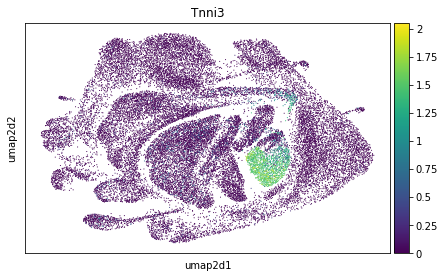

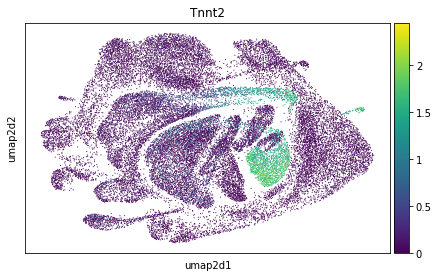

In [50]:
for gene in goi['4']:
    sc.pl.scatter(adata, color=gene, basis="umap2d")